<h1><center> 02806 Social data analysis and visualization Spring 22 <br> <br> Final Project Assignment B </center></h1>

- This explainer notebook should contain all the behind the scenes data-analysis stuff, details on the dataset, why you've selected these particular visualizations, explanations methodology, etc.

- Make sure that you use references when they're needed and follow academic standards.

- The notebook should contain your analysis and code. Please structure it into the following sections

In [1]:
import pandas as pd
import numpy as np
import geopandas as gpd
import matplotlib as mpl
import matplotlib.pyplot as plt
import pmdarima as pmd

from matplotlib.lines import Line2D
from matplotlib.patches import Patch
from statsmodels.tsa.seasonal import seasonal_decompose

import read
import model
import visualize
import utils

%matplotlib inline

# Part 1: Motivation

## 1.1: What is your dataset?

In [2]:
# your code goes here

## 1.2: Why did you choose this/these particular dataset(s)?

## 1.3: What was your goal for the end user's experience?

# Part 2: Basic Statistics

## 2.1: Write about your choices in <font color='blue'>data cleaning and preprocessing </font>

We are using two main sources of the data: pollution data and mobility data. Short description of cleaning and preprocessing of the data is contained under two following headlines.

## Pollution data

### General files structure

The data is available as multiple `.xlsx` files, groupped by years. One file contain measurements for one pollutant in one year. Some pollutants that are mesured in both hourly and daily manner have two files accordingly. One exception to the above rules is the year 2021, because data is not yet verified, so all the measurements are contained in a single file with multiple sheets.

Excell sheets are organized info a tabular format: 
* First column represents measurement time.
* All other columns represent measurements of specific stations.
* First few rows represent a header with generally redundant informations (e.g. type of pollution, which we already know from the sheet name).
* One of the header rows contain measurement station code.
* Each of the rows following header rows contain timestamp and measurements values at this timestamp.

### Handling variability of format

Since size and format of the header changes throughout the timespan of the data, we needed to adjust reading of specific years. 

Some of the files also have a different numeric separator -- they use ',' instead of '.'. 

In a case of 'PM2.5' pollutant, some of the files have names without a dot (i.e. 'PM25').

All of those cases were discovered manually and are handled by a function designed for it.

### Metadata

There are, additionally, files with general statistics and files with metadata about measurement stations. Relevant information for us are: station codes, coordinates of stations, regions in which they are situated and period of their operation. Some of measurement stations have coordinates set as `-999.0`, which we replaced with `np.NaN` values. We do not impute those values since they are not very relevant. In 2015 some stations changed their codes, so we have a special function for joining station codes that handle those cases.

### Reading and tranfofming the data

We created functions for loading the aforementioned data. Since the size of the data makes it impossible to read all the data into the memory at the same time, functions in `read.py` file read the data in chunks, reading only subset of the data specified by user. The most important funcion is `query_data_range()`. We also tranformed the data into a wide format by using `pd.melt()` function. Resulting data has a following format:

* Each row represents a measurement in a specific time, in a specific station, for a specific pollution.
* It consist of five columns: 
    - timestamp -- time and date of measurement,
    - station_code -- place of measurement id,
    - measurement -- value of measurement,
    - pollutant -- type of measured pollution,
    - exposition -- type of measurement (either 24 for daily measurements of 1 for hourly measurement)
* Optionally it may contain region, if data is read with automatic binding of stations.

Such format makes data easier to handle.

## Mobility data

Apple's devices users' data is available as a `.csv` file. It is organized in a tabular format. First few columns contain information about country of measurement and measurement type. Most of the columns represent specific days. We discard all the data from other regions, retaining only two rows about Poland: one contain data about pedestrains mobility, the oder is about people driving. There are no specification of regions for Poland.

We transpose the data, because treating specific days as observations is more convinient for further analysis. We also subtract 100.0 from all the measurements, because this value is treated as the baseline, a mobility of people at the beginning of publishing the data, at the beginning of pandemic. As a result, measurements are contained in an interval $[-100, +\infty)$, where value represents a percentage change relative to the start of pandemic. The resulting data frame contains a following columns:
* date -- date of measurement,
* mobility_walking -- relative change in mobility of people walking,
* mobility_driving -- relative cahnge in mobility of people driving.


## 2.2: Write a short section that discusses the dataset stats, containing key points/plots from your <font color ='blue'>exploratory data analysis.</font>

In [44]:
df_mobility = read.get_mobility_data()
geo_data = read.get_geo_data()

/home/rafaczd/Studia/sem10/SNaDV/project/read.py:119: DtypeWarning: Columns (3,4) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("data/mobility_trend_2022_04_10.csv")


**Answers:**

* map of stations in Poland, probably
* count total number of data cells
* include some plots from Haimi, general sstatistics


In [81]:
focus_regions = ['MAZOWIECKIE', 'SLASKIE', 'WARMINSKO-MAZURSKIE']

focus_regions_labels = {
    'MAZOWIECKIE': 'Mazowieckie (capital area)', 
    'SLASKIE': 'Śląskie (industrial area)', 
    'WARMINSKO-MAZURSKIE': 'Warmińsko-Mazurskie (green area)',
}

focus_region_colors = {
    'SLASKIE': '#E4572E',
    'WARMINSKO-MAZURSKIE': '#5B8E7D',
    'MAZOWIECKIE': '#FFE46B'
}

global_dpi = 300

In [8]:
stations_metadata = read.read_stations_metadata()

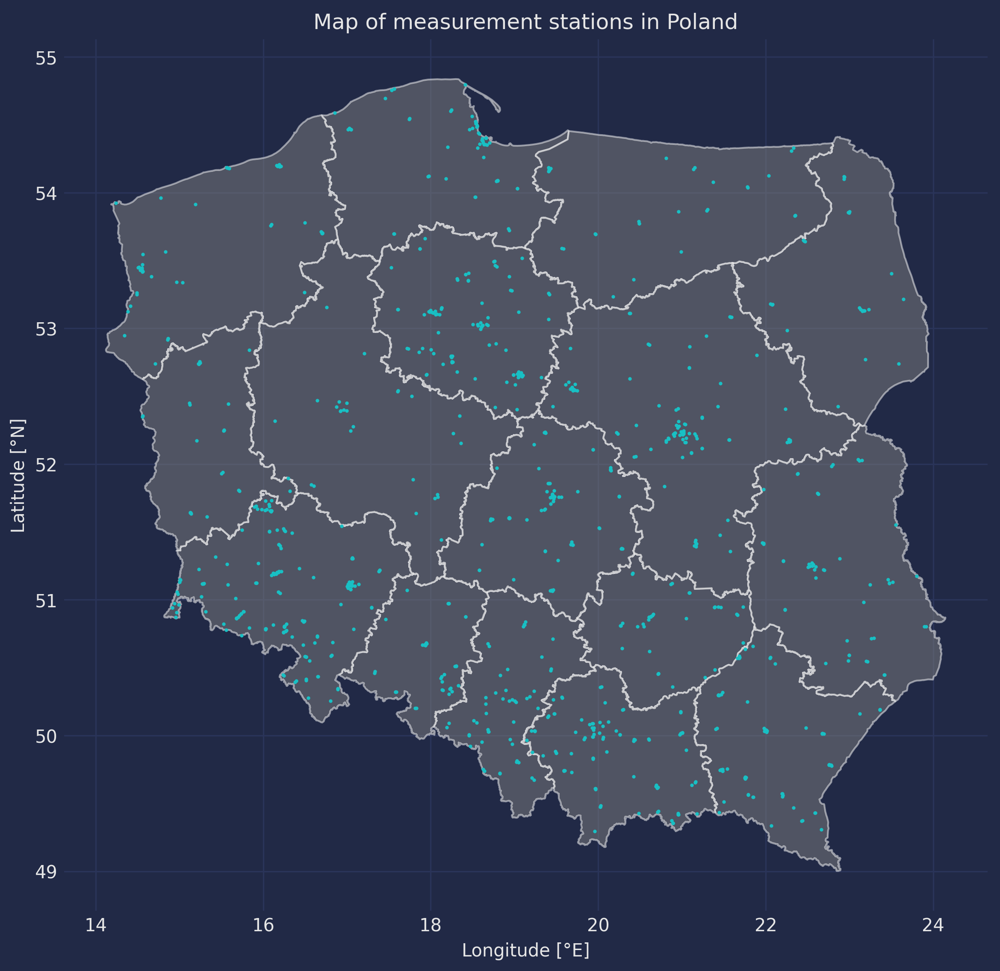

In [9]:
with plt.style.context(visualize.DEFAULT_THEME), plt.rc_context(visualize.DEFAULT_RC_PARAMS):
    fig, ax = plt.subplots()
    geo_data.plot(ax=ax, edgecolor='white', color='grey', alpha=0.5)
    ax.scatter(stations_metadata.longitude, stations_metadata.latitude, s=1)

    ax.set_title('Map of measurement stations in Poland')
    ax.set_xlabel('Longitude [°E]')
    ax.set_ylabel('Latitude [°N]')

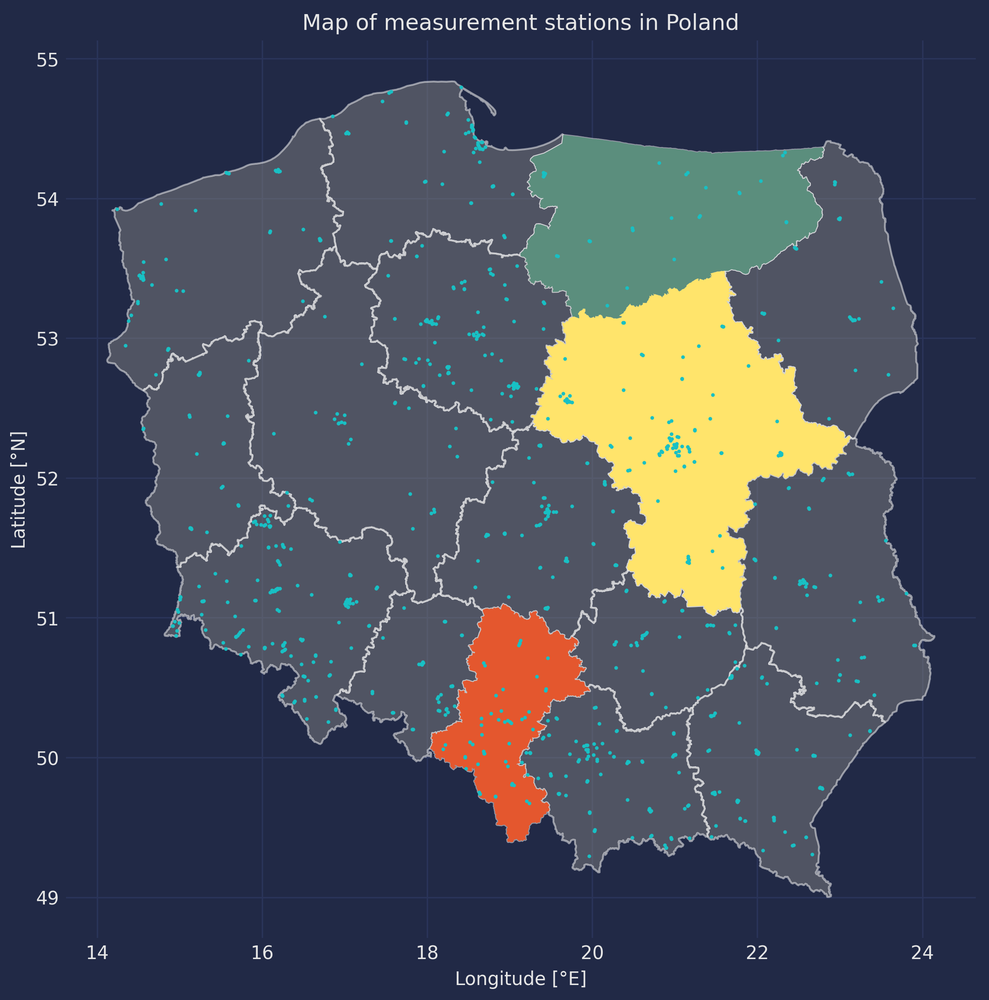

In [10]:
with plt.style.context(visualize.DEFAULT_THEME), plt.rc_context(visualize.DEFAULT_RC_PARAMS):
    fig, ax = plt.subplots()
    geo_data.plot(ax=ax, edgecolor='white', color='grey', alpha=0.5)
    for region in focus_regions:
        geo_data[geo_data.region == region].plot(color = focus_region_colors[region], ax=ax)
    ax.scatter(stations_metadata.longitude, stations_metadata.latitude, s=1)

    ax.set_title('Map of measurement stations in Poland')
    ax.set_xlabel('Longitude [°E]')
    ax.set_ylabel('Latitude [°N]')

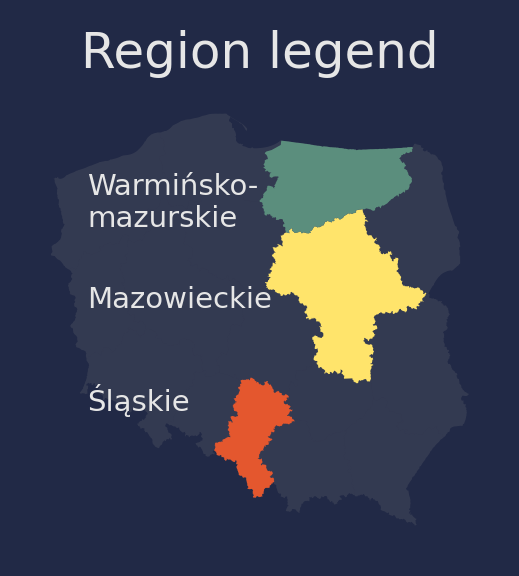

In [65]:
with plt.style.context(visualize.DEFAULT_THEME), plt.rc_context({'figure.figsize': (2, 2), 'figure.dpi': global_dpi}):
    fig, ax = plt.subplots()
    geo_data.plot(ax=ax, color='grey', alpha=0.2)
    for region in focus_regions:
        geo_data[geo_data.region == region].plot(color = focus_region_colors[region], ax=ax)
    
    for x, y, s in zip([15, 15, 15], [54, 52.4, 51], ['Warmińsko-\nmazurskie', 'Mazowieckie', 'Śląskie']):
        ax.text(x, y, s, size=7, verticalalignment='top')
    
    ax.set_title('Region legend')
    ax.set_xticks([])
    ax.set_yticks([])

In [256]:
stations_activity = pd.melt(stations_metadata[['active_since', 'active_until']]) \
    .sort_values('value')
stations_activity = stations_activity[~stations_activity.value.isna()]
stations_activity['change'] = np.where(stations_activity.variable == 'active_since', 1, -1)
stations_activity = stations_activity[['value', 'change']] \
    .groupby('value') \
    .sum() \
    .cumsum() \
    .reset_index() \
    .rename(columns={'value': 'date', 'change': 'active_stations'})
stations_activity = pd.DataFrame({'date': pd.date_range('1965-01-01', '2021-06-02')}) \
    .merge(stations_activity, on='date', how='left') \
    .ffill()

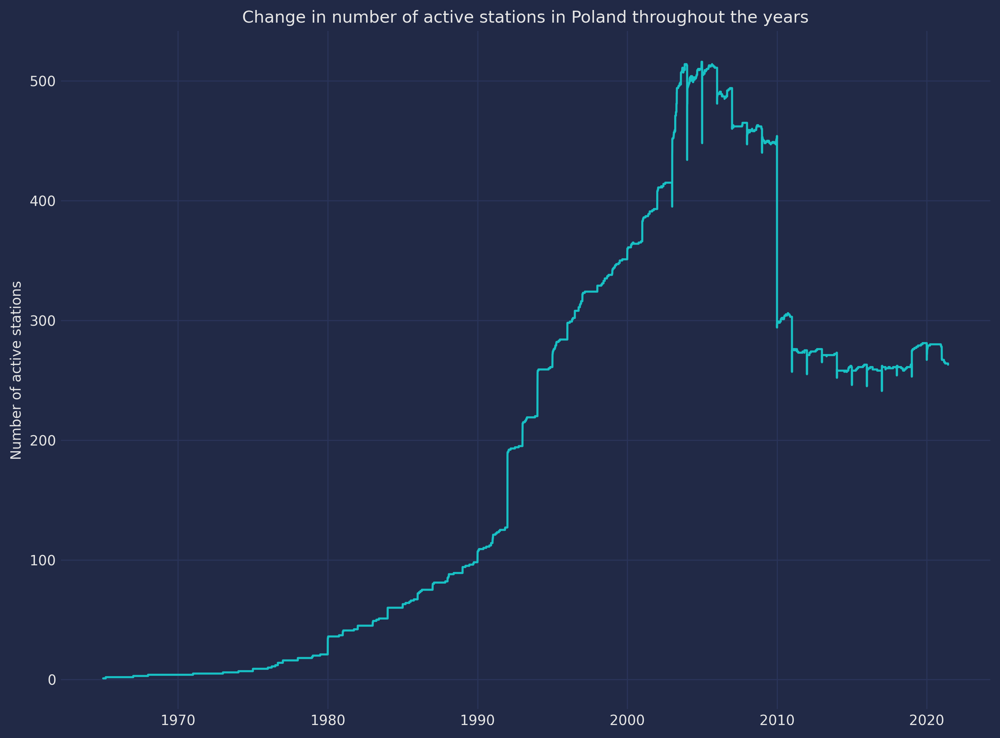

In [276]:
with plt.style.context(visualize.DEFAULT_THEME), plt.rc_context(visualize.DEFAULT_RC_PARAMS):
    fig, ax = plt.subplots()
    
    ax.plot(stations_activity.date, stations_activity.active_stations)
    ax.set_ylabel('Number of active stations')
    ax.set_title('Change in number of active stations in Poland throughout the years')
    

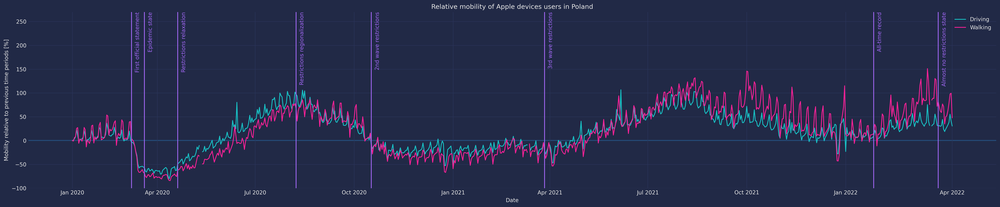

In [11]:
important_dates = {
    '2020-03-08': 'First official statement',
    '2020-03-20': 'Epidemic state',
    '2020-04-20': 'Restrictions relaxation',
    '2020-08-08': 'Restrictions regionalization',
    '2020-10-17': '2nd wave restrictions',
    '2021-03-27': '3rd wave restrictions',
    '2022-01-27': 'All-time record',
    '2022-03-28': 'Almost no restrictions state'
}
date_indices = df_mobility[df_mobility.date.isin(important_dates.keys())].index

fig, ax = visualize.plot_mobility_data(df_mobility, show=False, rc_params={'figure.figsize': (32, 6), 'figure.dpi': global_dpi})

for index, label in zip(date_indices, important_dates.values()):
    ax.axvline(index, color=visualize.get_theme_colors()[2])
    ax.text(index + 3, 270, label, rotation=90, color=visualize.get_theme_colors()[2], verticalalignment='top')

ax.set_ylim(-100, 270)
ax.axhline(0, zorder=-1)

plt.show()

TODO: describe the plot

# Part 3: <font color ='blue'>Data Analysis</font>

## 3.1 Overview of the data

The most interesting aspect of the data was to see if air pollution could depend on pandemics. By looking at any plot of pollution throughout the years, we can see, that the data is seasonal, but apparently contains some overall trend. We would like to assess whether this trend stays the same or if it is somehow changed by the pandemic. 

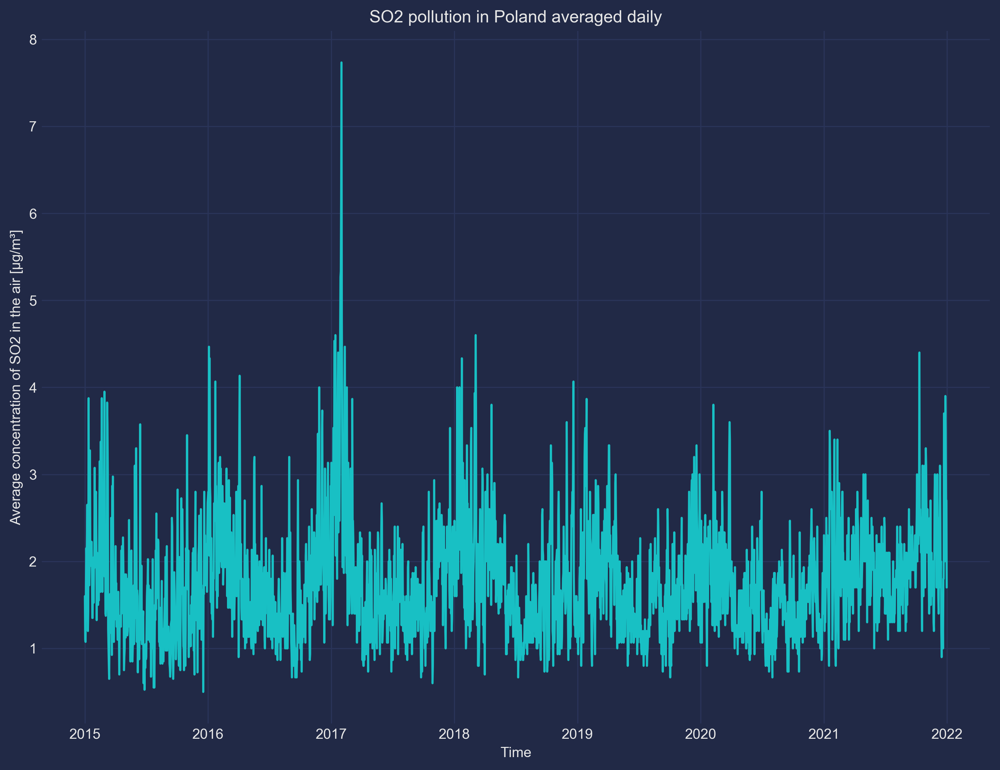

In [16]:
focus_years = list(range(2015, 2022))
# read all the records about SO2 measurements with daily exposition from focus years
df_SO2 = read.query_data_range(years=focus_years, pollutants='SO2', expositions=24) 
# average the measurements over every day
df_SO2_daily = model.group_and_reindex(df_SO2, 'daily')
# plot the data
visualize.plot_timeline_of_pollution(df_SO2_daily, 'SO2', 'daily')

Daily data contains a lot of noise that can make it difficult to tease information out of a chart. Therefore, we can look at the monthly data.

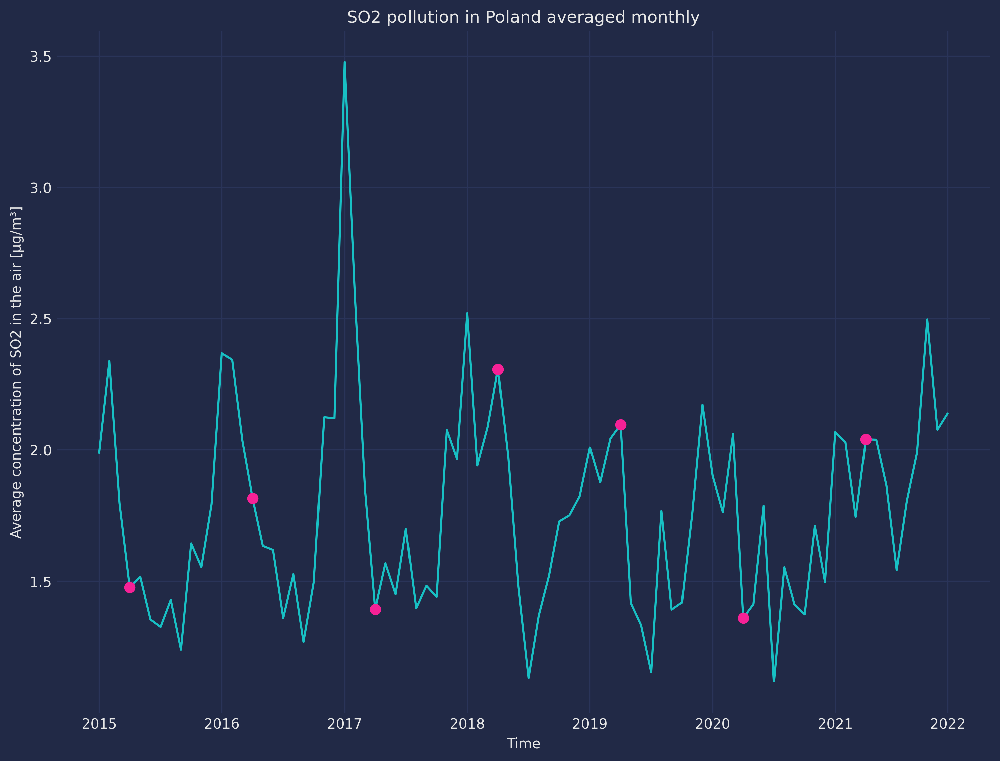

In [286]:
df_SO2_monthly = model.group_and_reindex(df_SO2, 'monthly')
fig, ax = visualize.plot_timeline_of_pollution(df_SO2_monthly, 'SO2', 'monthly', show=False)
# mark Aprils
ax.scatter(range(3, 87, 12), df_SO2_monthly.loc[list(range(3, 87, 12)), 'measurement'], 
           color=visualize.get_theme_colors()[1], zorder=2, s=50)
plt.show()

In the plot we can see that April 2020 presents the value lower that in any of the previous years -- that is the month when full lockdown went on in Poland.

But looking at the charts might not be enough. We want to have a mathematical proof that 2020 and 2021 are odd. The idea is to make a prediction of time series, i.e. predict values in years 2020 and 2021 basing on previous years. But first, we are going to look at general data for different regions.

## 3.2 Visualizing differences between regions for different pollutants

**TODO: Make plots with socio-economico-ecological comparison of Poland and describe them**

**TODO: write about following section**

In [164]:
focus_pollutants = ['PM10', 'PM2.5', 'CO', 'NOx']
focus_expositions = [24, 24, 1, 1]

df_pol_reg_mon = dict()
for pollutant, exposition in zip(focus_pollutants, focus_expositions):
    data = read.query_data_range(focus_years, pollutant, exposition)
    
    df_pol_reg_mon[pollutant] = {
        region:  model.group_and_reindex(data[data.region == region], 'monthly') 
        for region in focus_regions
    }

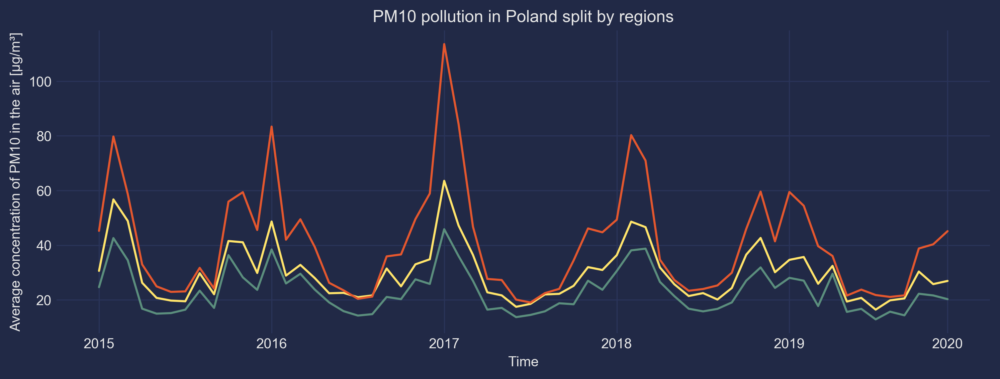

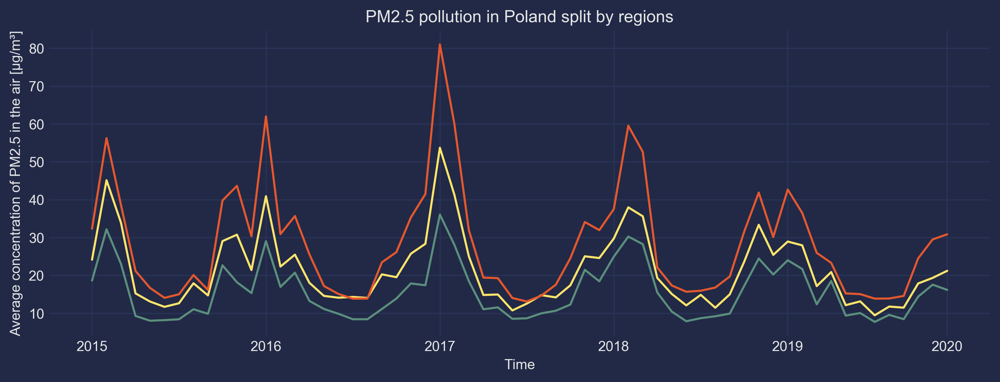

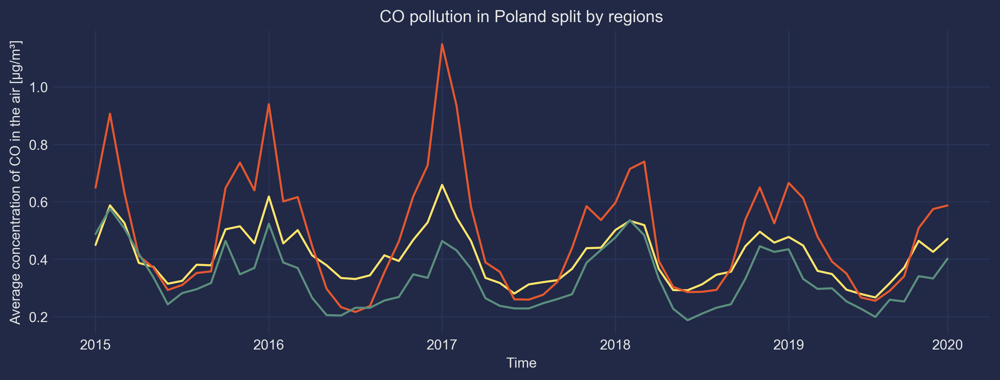

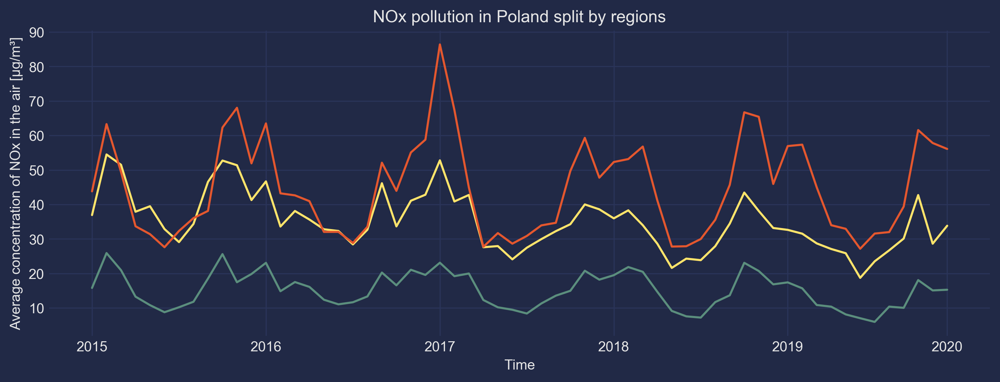

In [217]:
for pollutant in focus_pollutants:
    visualize.plot_timeline_of_pollution_for_regions(
        df_pol_reg_mon[pollutant], focus_regions, focus_region_colors, pollutant,
        rc_params={'figure.dpi': global_dpi, 'figure.figsize': (12, 4)})

**TODO: Describe plots, make some conclusions**

In [206]:
df_pol_reg_mon_avgs = None

for pollutant in focus_pollutants:
    for region in focus_regions:
        data = df_pol_reg_mon[pollutant][region]
        data[data.year < 2020]
        df_pol_reg_mon_avgs = pd.concat([df_pol_reg_mon_avgs, pd.DataFrame({
            'pollutant': [pollutant], 'region': [region], 
            'average': data.measurement.mean()})])

df_pol_reg_mon_avgs = df_pol_reg_mon_avgs.reset_index(drop=True)

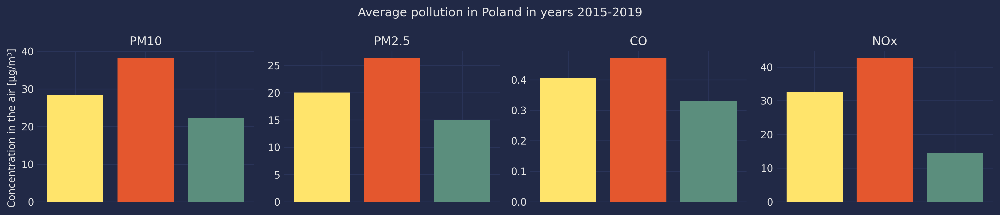

In [212]:
with plt.style.context(visualize.DEFAULT_THEME), plt.rc_context({'figure.figsize': (14, 3), 'figure.dpi': 300}):
    fig, axs = plt.subplots(1, len(focus_pollutants))

    for ax, pollutant in zip(axs, focus_pollutants):
        data = df_pol_reg_mon_avgs[df_pol_reg_mon_avgs.pollutant == pollutant]
        for row in data.index:
            region = data.loc[row, 'region']
            ax.bar(x=region, height=data.loc[row, 'average'], color=region_colors[region])
            ax.set_xticklabels([])
            ax.set_title(pollutant)
            
    axs[0].set_ylabel('Concentration in the air [μg/m³] ')
    
    fig.suptitle('Average pollution in Poland in years 2015-2019')
    fig.set_tight_layout(True)

Barchart with summary of focused pollution types clearly indicates differences between regions

## 3.3 ARIMA preliminary analysis for SO2 data

In order to make a prediction, we decided to use ARIMA model. According to the article [1], ARIMA is a simple and very often sufficient tool to limit simple realtions. Additionally, it does not require immense computational power.

The data we are dealing with is time series: a set of values distributed in time. From the preliminary analysis, the data appears to be seasonal, i.e. there exist some period of time (1 year) which displays similar pattern. We would like to model this data then using AutoRegressive Integrated Moving Average (ARIMA) model. It is actually a combination of three models: AR (autoregressive) I (integrated) MA (moving average) [2, 3]. That means that the value of measurement in the specified time is modelled as depending on the previous values. It also takes into account the seasonality of the data.

TODO: shall we introduce more equations?

The assumption here is that observation $y_t$ in a given moment can be decomposed into parts:

$$y_t = tre_t + sea_t + \epsilon_t$$

where $tre_t$ is the overall trend in the data, $sea_t$ is the component depending on the seasonal change (like here: every year in winter the pollution is higher) and $\epsilon_t$ is some random noise, something which escapes our assumptions. Errors are assumed to be independent and follow normal distribution.

Another important assumption is that $sea_t$ is an an autocorrelated [4] function of time. That means that value in time point $t$ is correlated with its delayed value at time point $t + lag$ for every $t$. The strength of correlation depends on the $lag$ and should be the strongest for the value of $lag$ equal to the length of period.

We are going to check the assumptions for our data using *statsmodels* python package, which automatically decomposes the values. We will also use *pmdarima* package for building ARIMA models and using its utility functions.


* [1]: [Medium Article](https://medium.com/@cdabakoglu/time-series-forecasting-arima-lstm-prophet-with-python-e73a750a9887)
* [2]: [The best Forecast Techniques or how to Predict from Time Series Data -- nice explaination of ARIMA](https://towardsdatascience.com/the-best-forecast-techniques-or-how-to-predict-from-time-series-data-967221811981)
* [3]: [Detailed article on ARIMA on Wikipedia](https://en.wikipedia.org/wiki/Autoregressive_integrated_moving_average)
* [4]: [About autocorrelation in stochastic processes](https://en.wikipedia.org/wiki/Autocorrelation)
* [5]: [statsmodels -- containing function for decomposing and plotting ACF](https://www.statsmodels.org/dev/index.html)
* [6]: [pmdarima -- functions for calculating arima](https://alkaline-ml.com/pmdarima/)


/home/rafaczd/Studia/sem10/SNaDV/project/venv/lib/python3.10/site-packages/pmdarima/utils/visualization.py:220: FutureWarning: the 'unbiased'' keyword is deprecated, use 'adjusted' instead.
  res = tsaplots.plot_acf(


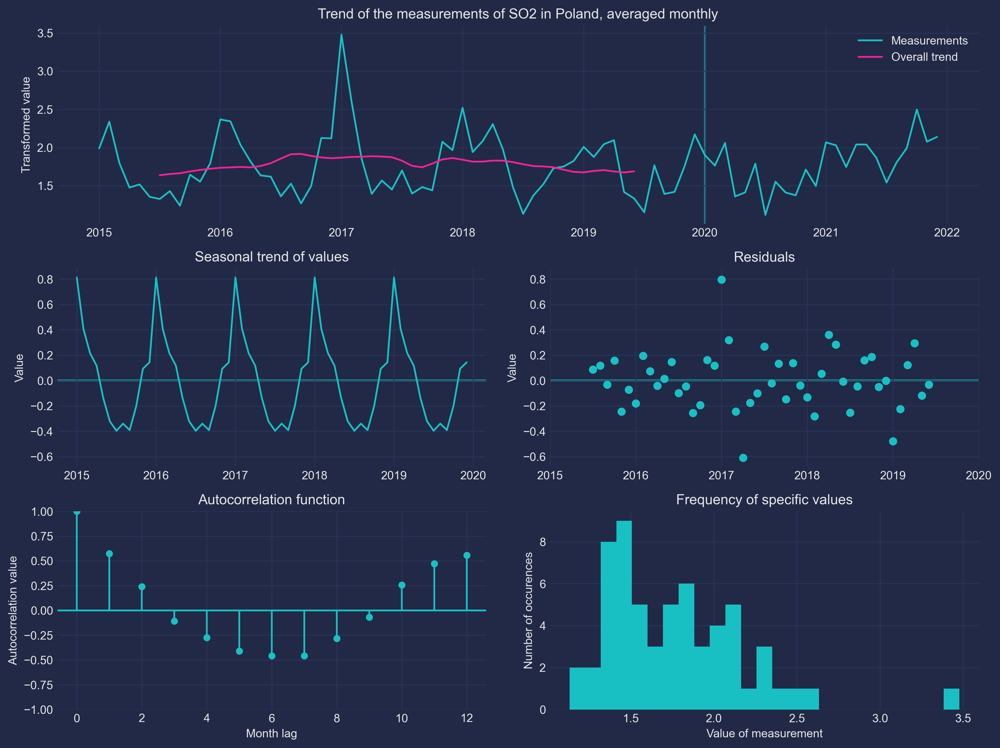

In [66]:
df_SO2_monthly_train, df_SO2_monthly_test = model.train_test_split_on_year(df_SO2_monthly)
decomposition_SO2_monthly = seasonal_decompose(df_SO2_monthly_train.measurement, model='add', period=12)

visualize.plot_full_pre_model_analysis(df_SO2_monthly_train, df_SO2_monthly_test, decomposition_SO2_monthly, 'SO2', 'monthly', transformed=False)

The plot consists of multiple parts. The top one shows the original data with the division into train (pre-2020) and test (2020-2021) datasets. Magenta line indicates the overall trend present in the data, extracted using `seasonal_decompose` function. It was fit only to the training data. Middle left panel displays the seasonality of variables, i.e. calculated seasonal deviation from the trend. We can clearly see that it exists: in winter months pollution is the highest, while in summer it reach lower values. Residuals (in the equation indicated as $\epsilon$ term) are presented in the middle right plot. Although most of them concentrates around 0, there are some notable outliers. Bottom left panel shows autocorelation function. We can see that values that are shifted by 12 months have positive correlation of over 0.5, while measurements shifted by 6 months have negative correlation of almost -0.5 -- that further proves seasonality of the data. Finally, bottom right plot shows distribution of values in the form of histogram. The data is skewed, which means ARIMA model may not be suitable for the data without any transformation.

There is, however, a way of handlng the skewed data. We can try to transform it using some power transformation [7]. We decided to use Box-Cox transformation, suggested by previously menitoned sources. It transforms the data inputs $y_i$ according to the formula:

$${\displaystyle y_{i}^{(\lambda )}={\begin{cases}{\dfrac {y_{i}^{\lambda }-1}{\lambda }}&{\text{if }}\lambda \neq 0,\\\ln y_{i}&{\text{if }}\lambda =0,\end{cases}}}$$

where $\lambda$ is some parameter. In the *pmdarima* package there are functions to automatically transform data and select some $\lambda$ parameter.

* [7]: [Power transformations](https://en.wikipedia.org/wiki/Power_transform#Box%E2%80%93Cox_transformation)

/home/rafaczd/Studia/sem10/SNaDV/project/venv/lib/python3.10/site-packages/pmdarima/utils/visualization.py:220: FutureWarning: the 'unbiased'' keyword is deprecated, use 'adjusted' instead.
  res = tsaplots.plot_acf(


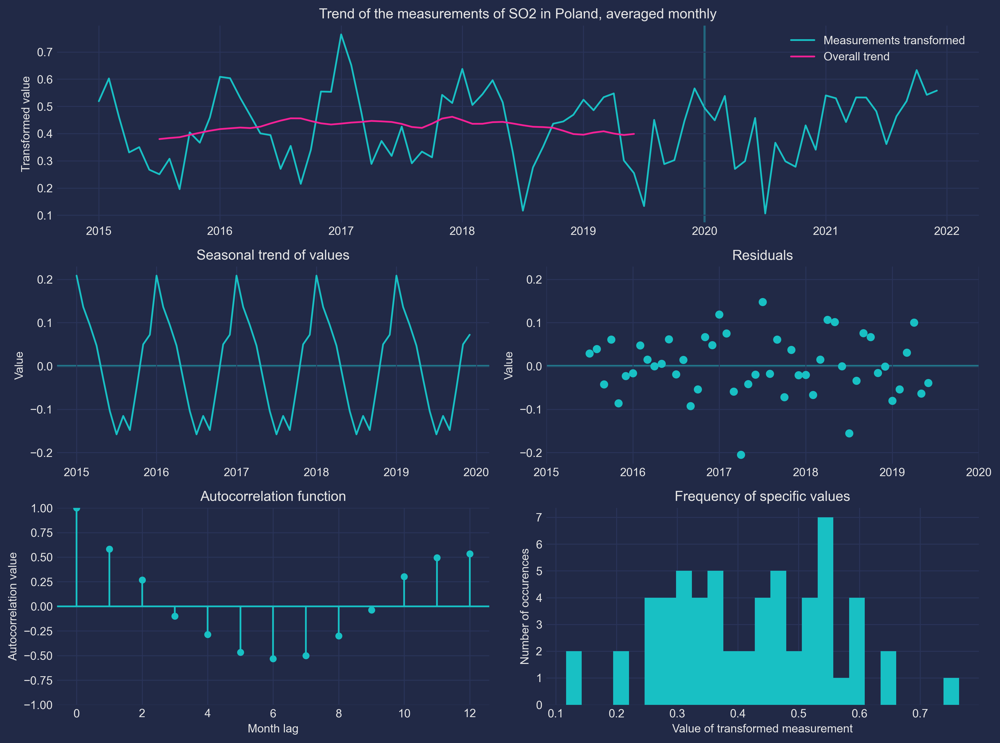

In [67]:
_, df_SO2_monthly_train_tf, df_SO2_monthly_test_tf = model.auto_transform(df_SO2_monthly_train, df_SO2_monthly_test)
decomposition_SO2_monthly_tf = seasonal_decompose(df_SO2_monthly_train_tf.measurement_transformed, model='add', period=12)

visualize.plot_full_pre_model_analysis(df_SO2_monthly_train_tf, df_SO2_monthly_test_tf, decomposition_SO2_monthly_tf, 'SO2', 'monthly', transformed=True)

The above plot shows data after transformations. We can see that the trend is more centralized over the data and the outliers are not that big. Also, distribution of values is more normal. That means that this data is more suitable for training the model. We can do it right now. *pmdarima* automatically selects the best model in its function `auto_arima`

## 3.4 Building SO2 model for transformed data

In [68]:
model_results = dict()
model_results['SO2'] = utils.unpack_to_dict(['model', 'df_train', 'df_test'], model.auto_model(df_SO2, 'monthly', True))

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=-101.229, Time=1.24 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=-65.812, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=-98.016, Time=0.58 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=-91.601, Time=0.24 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=73.895, Time=0.02 sec
 ARIMA(2,0,2)(0,0,1)[12] intercept   : AIC=-98.044, Time=0.67 sec
 ARIMA(2,0,2)(1,0,0)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(2,0,2)(2,0,1)[12] intercept   : AIC=-101.071, Time=2.01 sec
 ARIMA(2,0,2)(1,0,2)[12] intercept   : AIC=-100.582, Time=1.76 sec
 ARIMA(2,0,2)(0,0,0)[12] intercept   : AIC=-88.632, Time=0.21 sec
 ARIMA(2,0,2)(0,0,2)[12] intercept   : AIC=-97.363, Time=1.51 sec
 ARIMA(2,0,2)(2,0,0)[12] intercept   : AIC=-98.576, Time=2.05 sec
 ARIMA(2,0,2)(2,0,2)[12] intercept   : AIC=-99.964, Time=2.10 sec
 ARIMA(1,0,2)(1,0,1)[12] intercept   : AIC=-101.603, Time=0.95 sec
 ARIMA(1,0,2)(0,0,1)[12] intercept

In [304]:
visualize = reload(visualize)

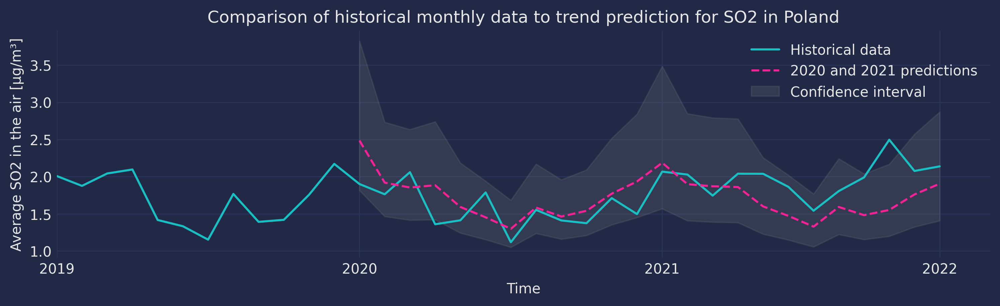

In [305]:
fig, ax = visualize.plot_historical_and_predictions(model_results['SO2'], 'SO2', 'monthly', show=False,
        rc_params={'figure.figsize': (12, 3), 'figure.dpi': global_dpi})
ax.set_xlim(4 * 12, 7 * 12 + 1)
plt.show()

We can see from the plot that the actual historical measurement quite follow the predicted observations with two notable exceptions: April of 2020 and October of 2021.

In [70]:
model.calc_rmse(model.calc_diffs(model_results['SO2']['df_test']))

0.11862932880680802

It is time to compare the data to the data from Apple devices. 

## 3.5 Comparison of deviation from prediction to mobility data

First, we want to reduce the seasonal noise in the data by grouping it into months. Then we can plot it alongside the historical data, predictions and differences.

In [71]:
df_mobility_monthly = df_mobility.groupby(['year', 'month']) \
    [['mobility_driving', 'mobility_walking']] \
    .mean() \
    .reset_index()

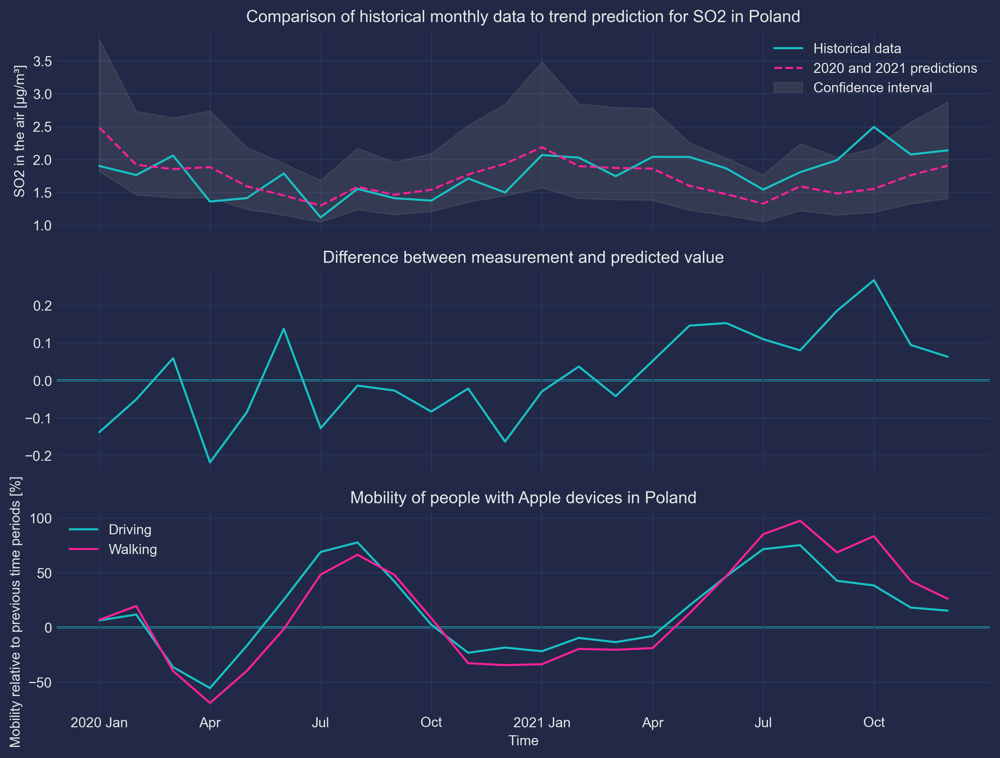

In [295]:
visualize.plot_historical_and_predictions_and_mobility(
    model_results['SO2'], df_mobility_monthly, 'SO2', 'monthly')

TODO: write about weekly and daily data and why not using it

In [73]:
np.corrcoef(
model_results['SO2']['df_test'].measurement_transformed - model_results['SO2']['df_test'].prediction_transformed,
df_mobility_monthly[df_mobility_monthly.year.isin([2020, 2021])].mobility_driving
)

array([[1.        , 0.44077435],
       [0.44077435, 1.        ]])

## 3.6 Prediction for other pollutants

In [297]:
for pollutant, exposition in zip(focus_pollutants, focus_expositions):
    data = read.query_data_range(focus_years, pollutant, exposition)
    model_results[pollutant] = utils.unpack_to_dict(['model', 'df_train', 'df_test'], model.auto_model(data, 'monthly', True))

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=-218.280, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.11 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=207.337, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.09 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=-266.308, Time=0.44 sec
 ARIMA(0,0,0)(2,0,1)[12] intercept   : AIC=-263.498, Time=1.01 sec
 ARIMA(0,0,0)(1,0,2)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,0,0)(0,0,2)[12] intercept   : AIC=inf, Time=0.58 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(0,0,0)(2,0,2)[12] intercept   : AIC=-258.718, Time=1.12 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.59 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.96 sec
 AR

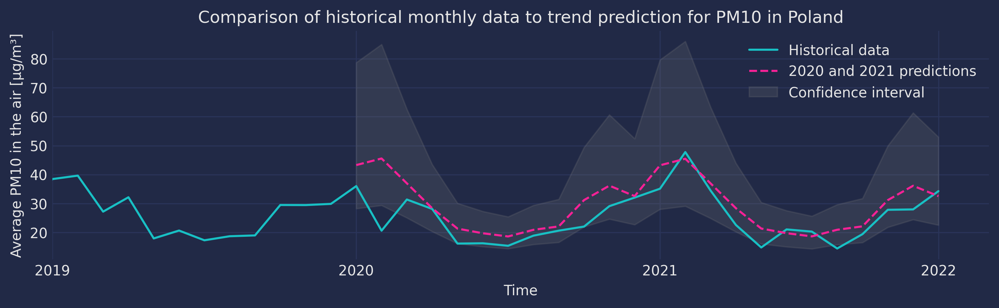

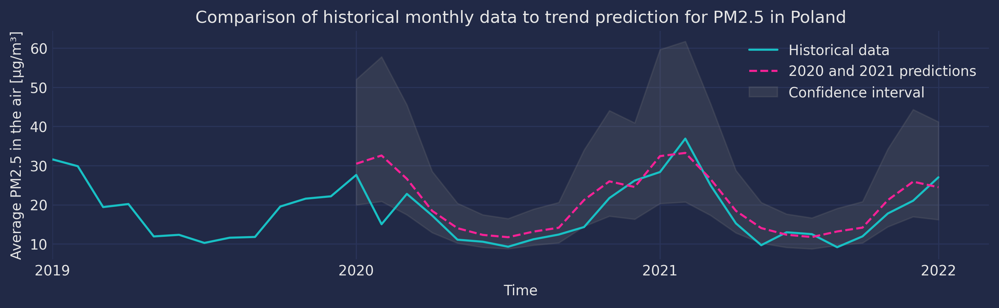

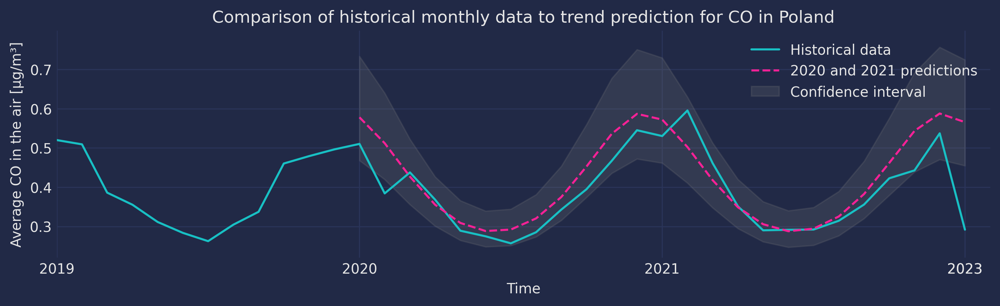

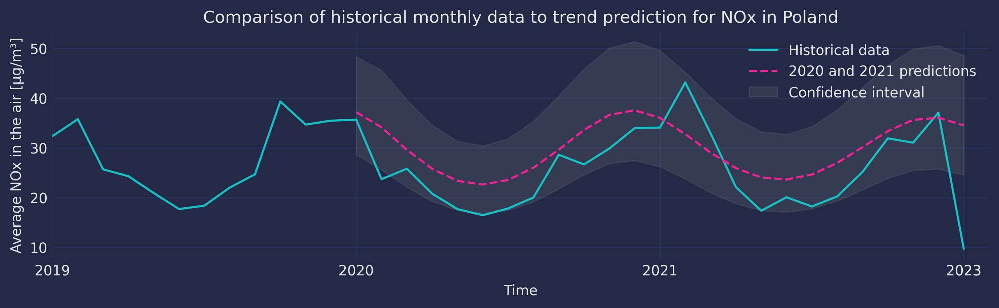

In [306]:
for pollutant in focus_pollutants:
    fig, ax = visualize.plot_historical_and_predictions(
        model_results[pollutant], pollutant, 'monthly', show=False,
        rc_params={'figure.figsize': (12, 3), 'figure.dpi': global_dpi}
    )
    ax.set_xlim(4 * 12, 7 * 12 + 1)
    plt.show()

In [307]:
for pollutant in focus_pollutants:
    print(f'{pollutant} RMSE: {model.calc_rmse(model.calc_diffs(model_results[pollutant]["df_test"]))}')

PM10 RMSE: 0.029822611032164943
PM2.5 RMSE: 0.061328820017775384
CO RMSE: 0.1751123923676148
NOx RMSE: 0.20730136211427902


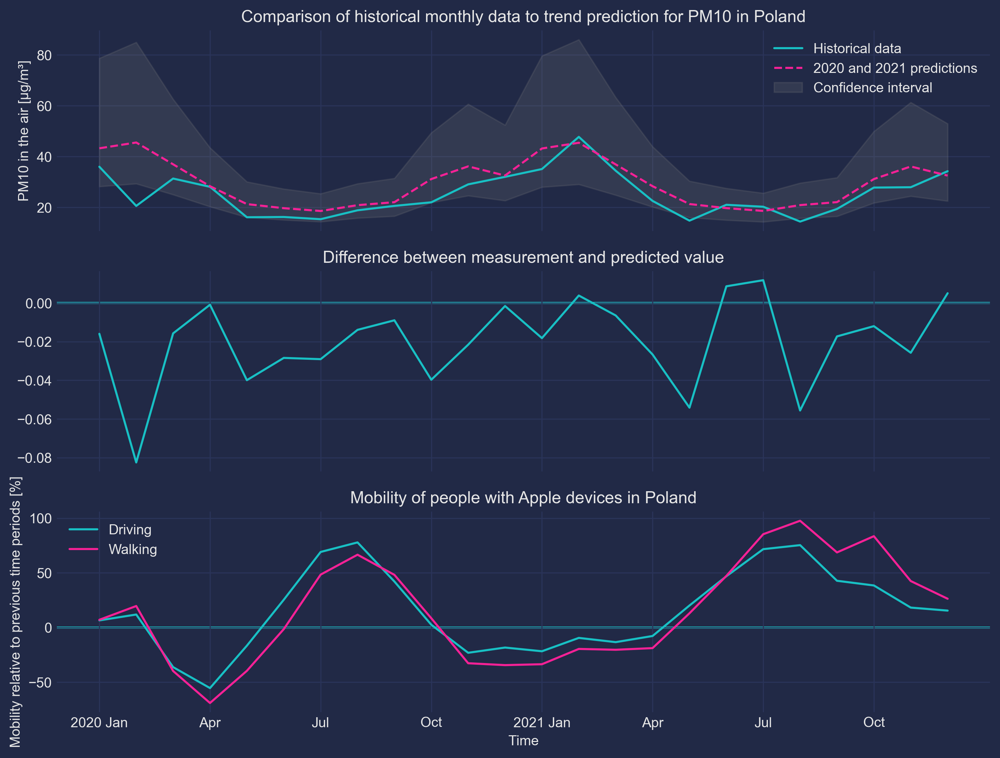

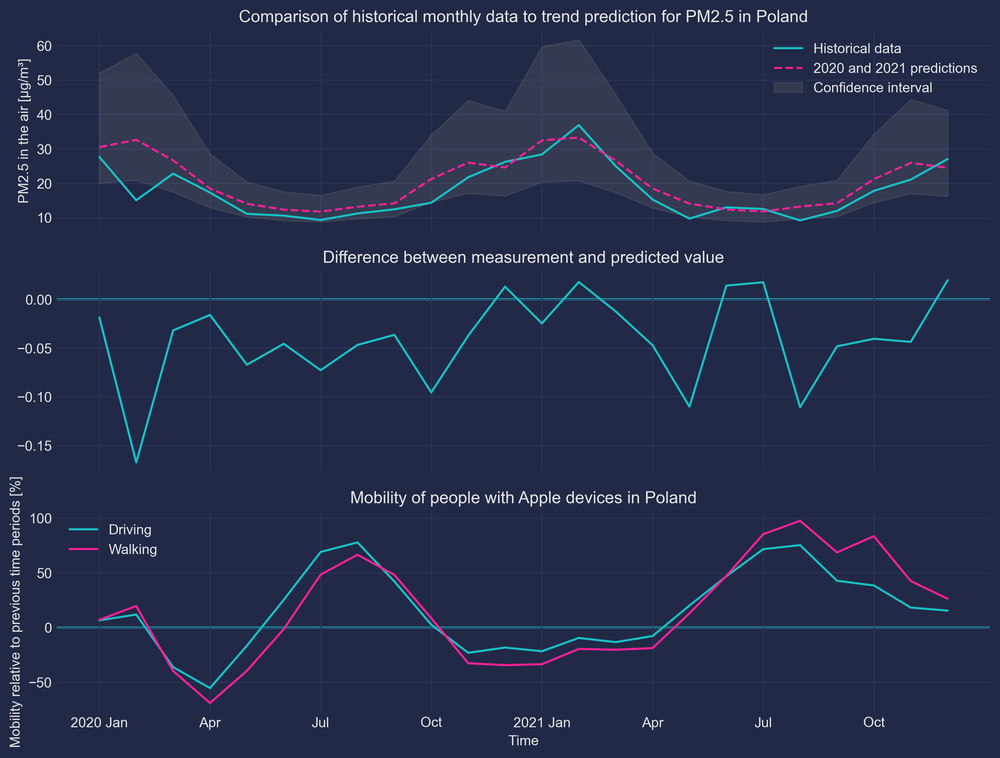

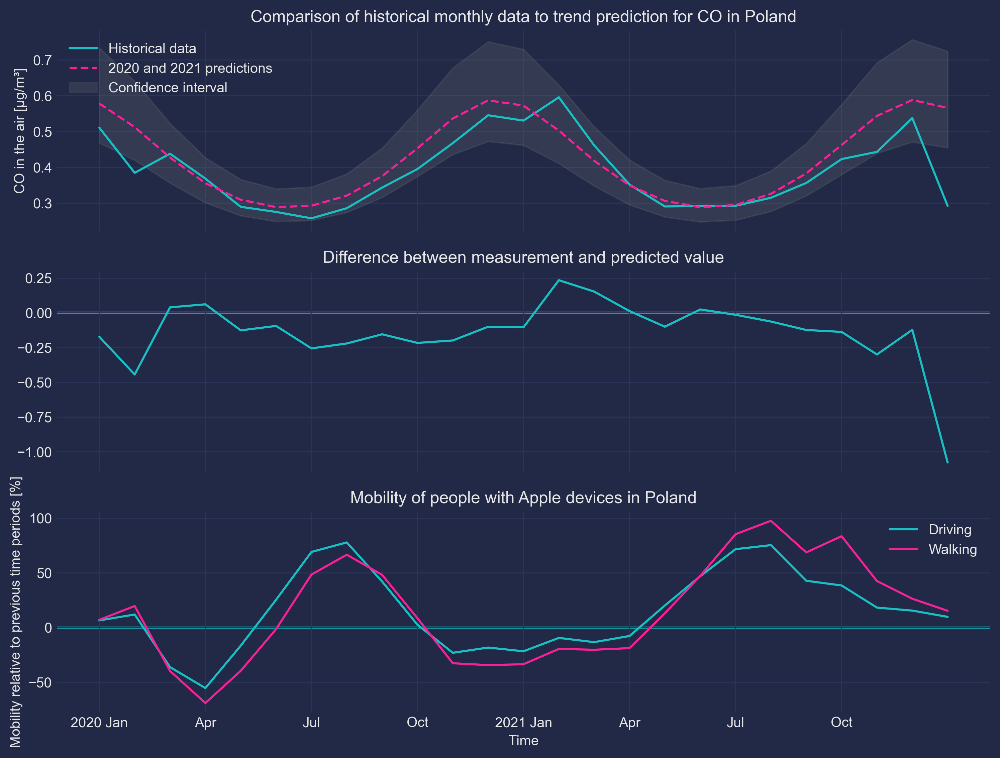

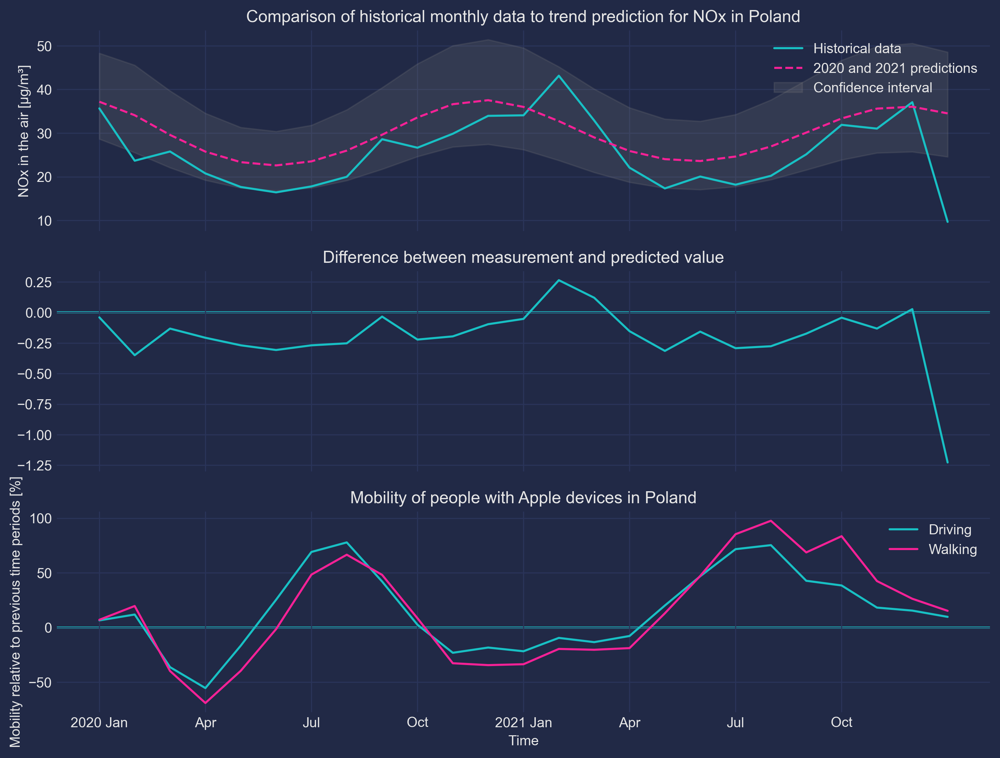

In [308]:
for pollutant in focus_pollutants:
    visualize.plot_historical_and_predictions_and_mobility(model_results[pollutant], df_mobility_monthly, pollutant, 'monthly')

In [311]:
for pollutant in focus_pollutants:
    rmse = np.corrcoef(
model_results[pollutant]["df_test"].measurement_transformed - \
model_results[pollutant]["df_test"].prediction_transformed,
df_mobility_monthly[df_mobility_monthly.year.isin([2020, 2021])].mobility_driving
)[0, 1]
    print(f'{pollutant} RMSE: {rmse}')


PM10 RMSE: -0.06362167140060836
PM2.5 RMSE: -0.1730071013118875


ValueError: all the input array dimensions for the concatenation axis must match exactly, but along dimension 1, the array at index 0 has size 25 and the array at index 1 has size 24

## 3.7 Analysis of predictions of PM10 for specific regions

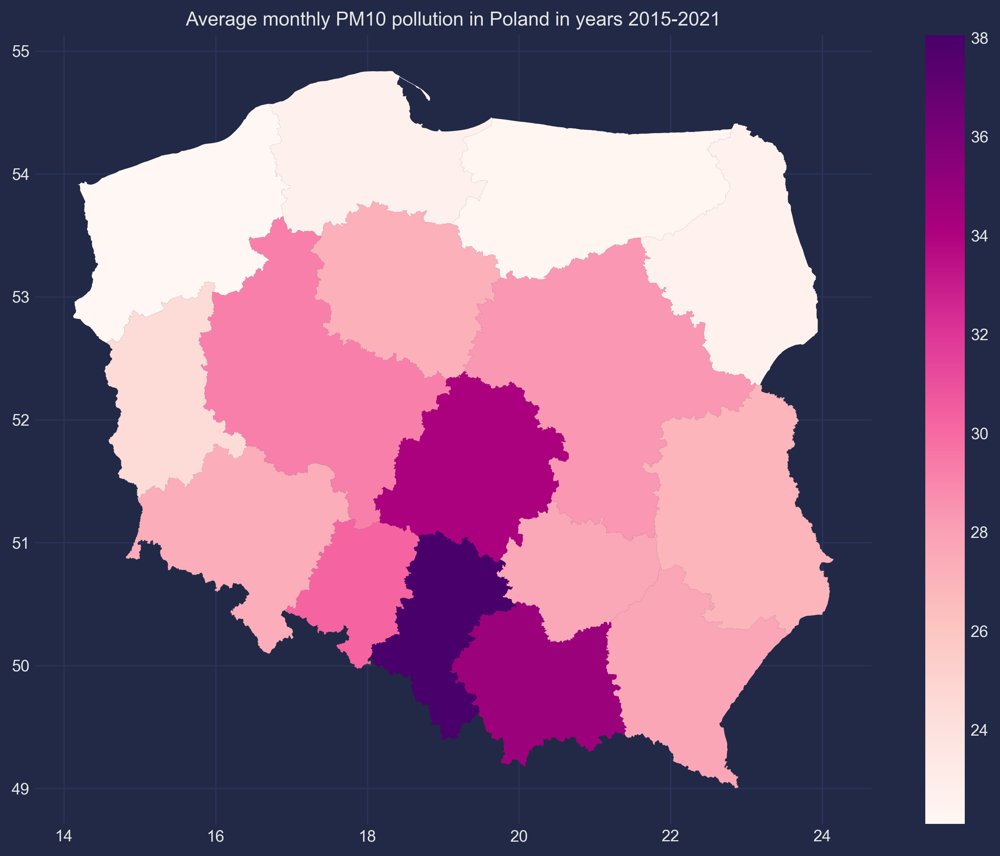

In [215]:
df_PM10 = read.query_data_range(years=focus_years, pollutants='PM10', expositions=24)

avg_PM10_pollution = df_PM10 \
    .groupby(['timestamp', 'region']) \
    .agg(np.nanmean) \
    .reset_index() \
    .groupby('region') \
    .mean() \
    .reset_index()[['region', 'measurement']]
geo_data_PM10 = geo_data.merge(avg_PM10_pollution, on='region')
visualize.plot_map_with_values(geo_data_PM10, 'measurement', 
                               title='Average monthly PM10 pollution in Poland in years 2015-2021')

TODO: describe that for monthly data it is not very normal

/home/rafaczd/Studia/sem10/SNaDV/project/venv/lib/python3.10/site-packages/pmdarima/utils/visualization.py:220: FutureWarning: the 'unbiased'' keyword is deprecated, use 'adjusted' instead.
  res = tsaplots.plot_acf(


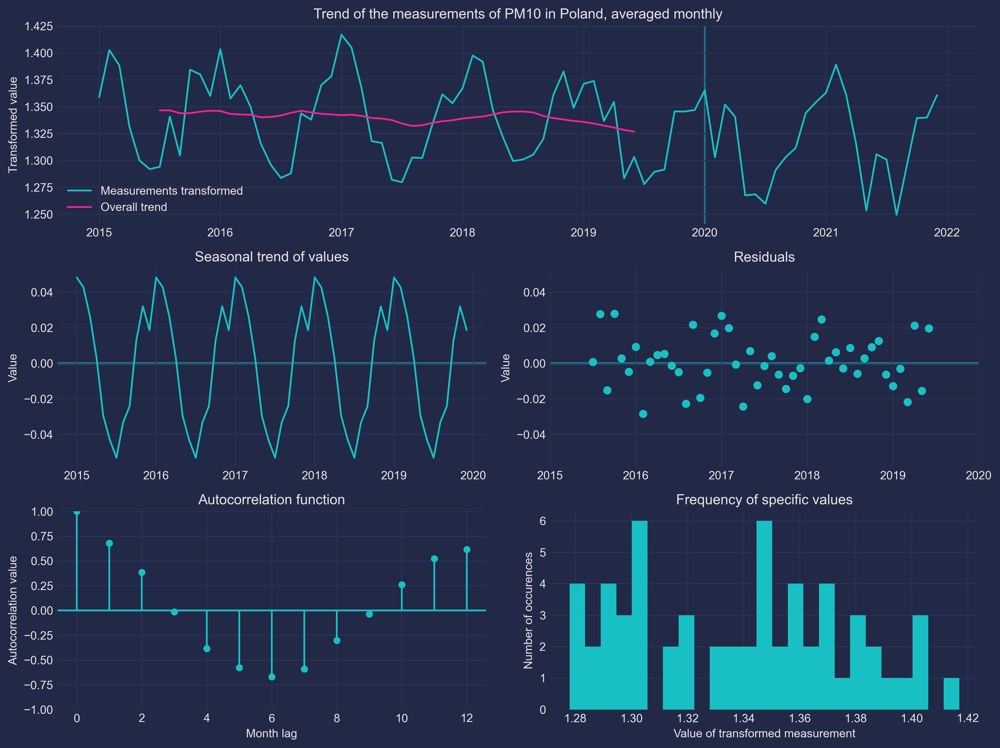

In [76]:
df_PM10_monthly = model.group_and_reindex(df_PM10, 'monthly')
df_PM10_monthly_train, df_PM10_monthly_test = model.train_test_split_on_year(df_PM10_monthly)
_, df_PM10_monthly_train_tf, df_PM10_monthly_test_tf = model.auto_transform(df_PM10_monthly_train, df_PM10_monthly_test)
decomposition_PM10_monthly_tf = seasonal_decompose(df_PM10_monthly_train_tf.measurement_transformed, model='add', period=12)
visualize.plot_full_pre_model_analysis(df_PM10_monthly_train_tf, df_PM10_monthly_test_tf, decomposition_PM10_monthly_tf, 'PM10', 'monthly', transformed=True)

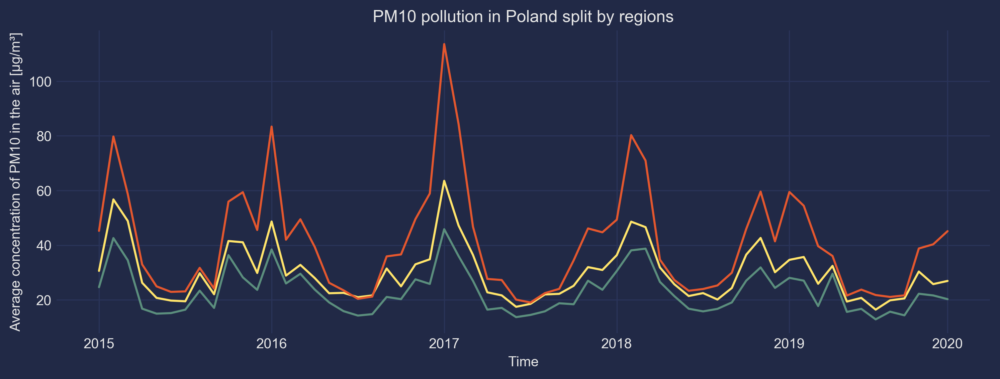

In [161]:
visualize.plot_timeline_of_pollution_for_regions(df_pol_reg_mon['PM10'], focus_regions, focus_region_colors, 'PM10', rc_params={'figure.dpi': global_dpi, 'figure.figsize': (12, 4)})

In [162]:
model_results_regional = dict()
model_results_regional['PM10'] = {
    region: utils.unpack_to_dict(
        ['model', 'df_train', 'df_test'], 
         model.auto_model(df_PM10[df_PM10.region == region], 'monthly', transform=True)) for region in focus_regions}

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.03 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=-289.632, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=-310.543, Time=0.29 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=190.254, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=-306.283, Time=0.08 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=-306.012, Time=0.76 sec
 ARIMA(0,0,1)(0,0,2)[12] intercept   : AIC=-313.459, Time=0.79 sec
 ARIMA(0,0,1)(1,0,2)[12] intercept   : AIC=-314.816, Time=1.06 sec
 ARIMA(0,0,1)(2,0,2)[12] intercept   : AIC=-311.165, Time=1.05 sec
 ARIMA(0,0,1)(2,0,1)[12] intercept   : AIC=inf, Time=1.80 sec
 ARIMA(0,0,0)(1,0,2)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(1,0,1)(1,0,2)[12] intercept   : AIC=-315.618, Time=1.31 sec
 ARIMA(1,0,1)(0,0,2)[12] intercept   : AIC=-315.791, Time=1.48 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : A

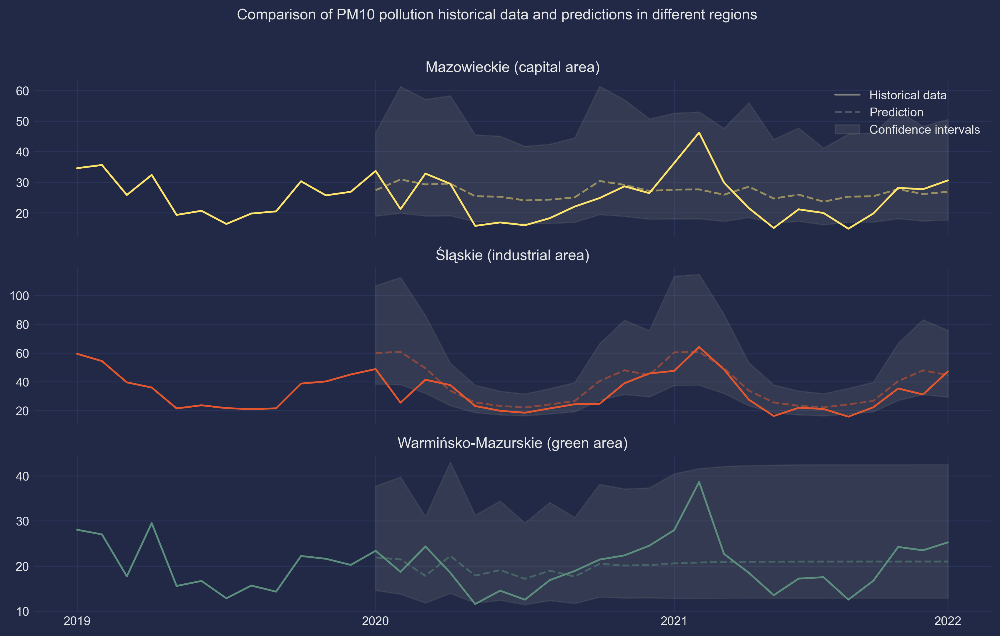

In [135]:
visualize.plot_comparison_of_regions(model_results_regional['PM10'], focus_regions, focus_regions_labels, 
                                    'PM10', focus_region_colors, False, rc_params={'figure.figsize': (14, 8), 'figure.dpi': 300})

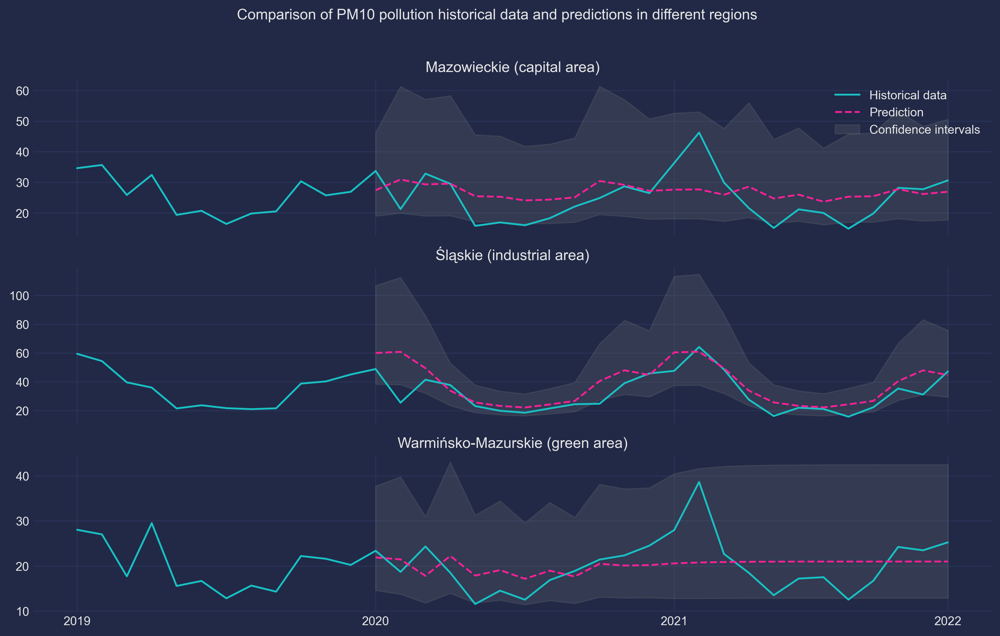

In [136]:
visualize.plot_comparison_of_regions(model_results_regional['PM10'], focus_regions, focus_regions_labels, 
                                    'PM10', one_panel=False, rc_params={'figure.figsize': (14, 8), 'figure.dpi': 300})

([48, 60, 72, 83], [2019, 2020, 2021, 2022])


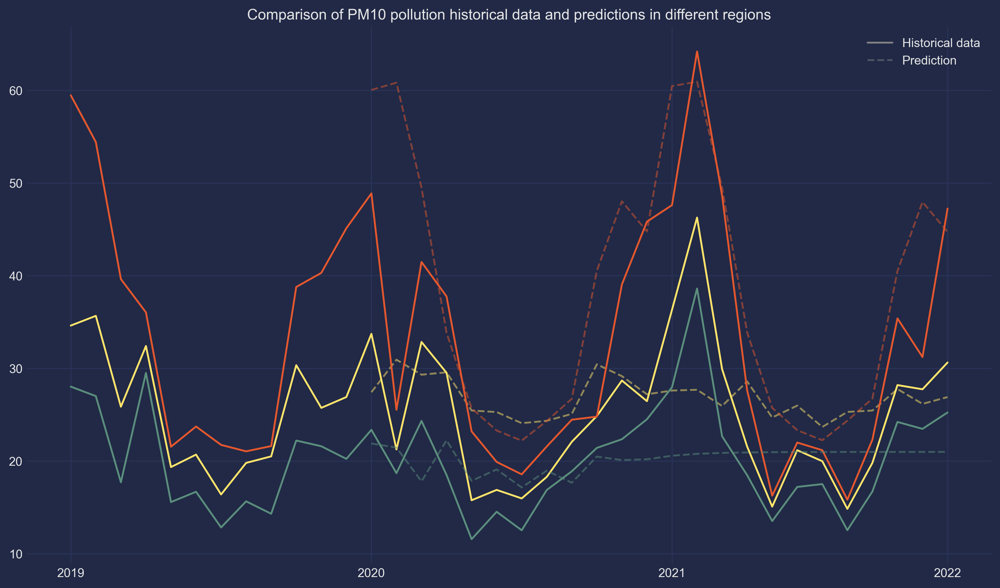

In [137]:
visualize.plot_comparison_of_regions(model_results_regional['PM10'], focus_regions, focus_regions_labels, 
                                    'PM10', focus_region_colors, one_panel=True, rc_params={'figure.figsize': (14, 8), 'figure.dpi': 300})

## 3.6 Modelling all selected pollutants

In [ ]:
# for pollutant, exposition in zip(
#     ['NOx', 'CO', 'O3', 'PM2.5'],
#     [1, 1, 1, 24]
# ):
#     data = read.query_data_range(years=focus_years, pollutants=pollutant, expositions=exposition)
#     model_results_regional[pollutant] = dict()
#     for region in selected_regions:
#         regional_data = data[data.region == region]
#         results = model.auto_model(regional_data, 'monthly', transform=True)
#         model_results_regional[pollutant][region] = utils.unpack_to_dict(['model', 'df_train', 'df_test'], results)

In [ ]:
# for pollutant in ['NOx', 'CO', 'O3', 'PM2.5', 'PM10']:
#     visualize.plot_comparison_of_regions(model_results_regional[pollutant], selected_regions, selected_regions_labels, 
#                                     pollutant, 'monthly')

# Part 4: Genre

## 4.1: Which genre of data story did you use?

**Answers:**


## 4.2: Which tools did you use from each of the 3 categories of Visual Narrative (Figure 7 in Segal and Heer). Why?

**Answers:**


## 4.3: Which tools did you use from each of the 3 categories of Narrative Structure (Figure 7 in Segal and Heer). Why?

**Answers:**


# Part 5: Visualizations

## 5.1: Explain the visualizations you've chosen.

In [ ]:
# your code might go here

**Answers:**


## 5.2: Why are they right for the story you want to tell?

**Answers:**


# Part 6: Discussion
**Think critically about your creation.**

## 6.1: What went well?

**Answers:**


## 6.2: What is still missing? What could be improved? Why?

**Answers:**


# Contributions
- Who did what?

- You should write (just briefly) which group member was the main responsible for which elements of the assignment. (I want you guys to understand every part of the assignment, but usually there is someone who took lead role on certain portions of the work. That's what you should explain).

- It is not OK simply to write "All group members contributed equally".

# References